In [19]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_auc_score, roc_curve, plot_roc_curve
from sklearn.preprocessing import LabelEncoder, StandardScaler, LabelBinarizer, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings("ignore")

<h1 style="background-color:#ABFF9B;font-size:20px;color:#00033E;font-weight : bold">Read the data </h1>

In [20]:
data = pd.read_csv(r'C:\Users\patil\Downloads\Rainfall_Data.csv')
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2856,11,18.3,35.4,0.0,10.7,8.2,15,31,0,...,17,14,1012.8,1010.7,3,7,26.3,34.0,0,1
1,575,0,12.0,21.1,0.0,2.4,4.9,11,22,15,...,70,60,1022.3,1020.2,2,7,16.2,19.4,0,0
2,2037,6,11.9,17.0,1.6,5.6,0.8,5,48,4,...,71,88,1008.4,1004.7,7,7,14.6,13.3,1,1
3,2010,19,1.3,10.2,4.2,2.6,4.4,15,33,15,...,87,64,1018.4,1016.8,7,7,3.8,8.5,1,0
4,2895,18,23.7,31.5,0.0,11.0,12.1,4,35,2,...,53,50,1014.2,1010.2,3,1,29.1,30.4,0,0


In [22]:
data.describe()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
count,24196.000000,24196.000000,24196.000000,24196.000000,24196.000000,24196.000000,24196.000000,24196.000000,24196.000000,24196.000000,...,24196.000000,24196.000000,24196.000000,24196.000000,24196.000000,24196.000000,24196.000000,24196.000000,24196.000000,24196.000000
mean,1702.554430,11.126880,13.281232,23.124078,3.008857,5.114329,6.700591,7.752273,42.371880,7.315424,...,69.505621,55.335345,1016.774682,1014.508518,4.767152,4.926682,17.609216,21.493420,0.293396,0.453918
std,837.645705,6.397324,6.084032,6.681013,8.399269,3.549384,3.958287,4.788052,14.221336,4.634019,...,17.671186,20.907040,6.987625,6.877345,2.741416,2.586083,6.189396,6.535474,0.455328,0.497882
min,0.000000,0.000000,-4.700000,4.100000,0.000000,0.000000,0.000000,0.000000,9.000000,0.000000,...,3.000000,0.000000,980.500000,979.000000,0.000000,0.000000,-0.700000,3.700000,0.000000,0.000000
25%,984.000000,6.000000,8.600000,17.900000,0.000000,2.400000,3.400000,3.000000,31.000000,3.000000,...,58.000000,41.000000,1012.200000,1009.900000,2.000000,3.000000,12.700000,16.500000,0.000000,0.000000
50%,1651.000000,11.000000,13.100000,22.700000,0.000000,4.400000,7.200000,8.000000,41.000000,7.000000,...,70.000000,56.000000,1016.800000,1014.400000,6.000000,6.000000,17.300000,21.100000,0.000000,0.000000
75%,2381.000000,17.000000,18.000000,28.100000,1.800000,7.000000,10.000000,12.000000,50.000000,11.000000,...,83.000000,70.000000,1021.400000,1019.000000,7.000000,7.000000,22.300000,26.200000,1.000000,1.000000
max,3415.000000,22.000000,31.400000,46.800000,206.200000,59.800000,14.500000,15.000000,122.000000,15.000000,...,100.000000,100.000000,1040.200000,1037.000000,8.000000,9.000000,39.400000,46.100000,1.000000,1.000000


In [23]:
mean_MinTemp = data['MinTemp'].mean()
data['MinTemp']=data.MinTemp.mask(data.MinTemp == 0,mean_MinTemp)

mean_Rainfall = data['Rainfall'].mean()
data['Rainfall']=data.Rainfall.mask(data.Rainfall == 0,mean_Rainfall)

mean_Evaporation = data['Evaporation'].mean()
data['Evaporation']=data.Evaporation.mask(data.Evaporation == 0,mean_Evaporation)

mean_Sunshine = data['Sunshine'].mean()
data['Sunshine']=data.Sunshine.mask(data.Sunshine == 0,mean_Sunshine)

mean_Humidity3pm = data['Humidity3pm'].mean()
data['Humidity3pm']=data.Humidity3pm.mask(data.Humidity3pm == 0,mean_Humidity3pm)

mean_Cloud9am = data['Cloud9am'].mean()
data['Cloud9am']=data.Cloud9am.mask(data.Cloud9am == 0,mean_Cloud9am)

mean_Cloud3pm = data['Cloud3pm'].mean()
data['Cloud3pm']=data.Cloud3pm.mask(data.Cloud3pm == 0,mean_Cloud3pm)

mean_Temp9am = data['Temp9am'].mean()
data['Temp9am']=data.Temp9am.mask(data.Temp9am == 0,mean_Temp9am)

data.eq(0).any()

Date              True
Location          True
MinTemp          False
MaxTemp          False
Rainfall         False
Evaporation      False
Sunshine         False
WindGustDir       True
WindGustSpeed    False
WindDir9am        True
WindDir3pm        True
WindSpeed9am     False
WindSpeed3pm     False
Humidity9am      False
Humidity3pm      False
Pressure9am      False
Pressure3pm      False
Cloud9am         False
Cloud3pm         False
Temp9am          False
Temp3pm          False
RainToday         True
RainTomorrow      True
dtype: bool

In [24]:
x = data.drop(['RainTomorrow'], axis=1)
y = data.RainTomorrow

In [25]:
X_train, X_test, y_train, y_test = train_test_split(x,y, random_state=2021, test_size=0.25)

In [26]:
print("X_train:", X_train.shape) 
print("X_test:",X_test.shape) 
print("y_train:",y_train.shape) 
print("y_test:",y_test.shape) 

X_train: (18147, 22)
X_test: (6049, 22)
y_train: (18147,)
y_test: (6049,)


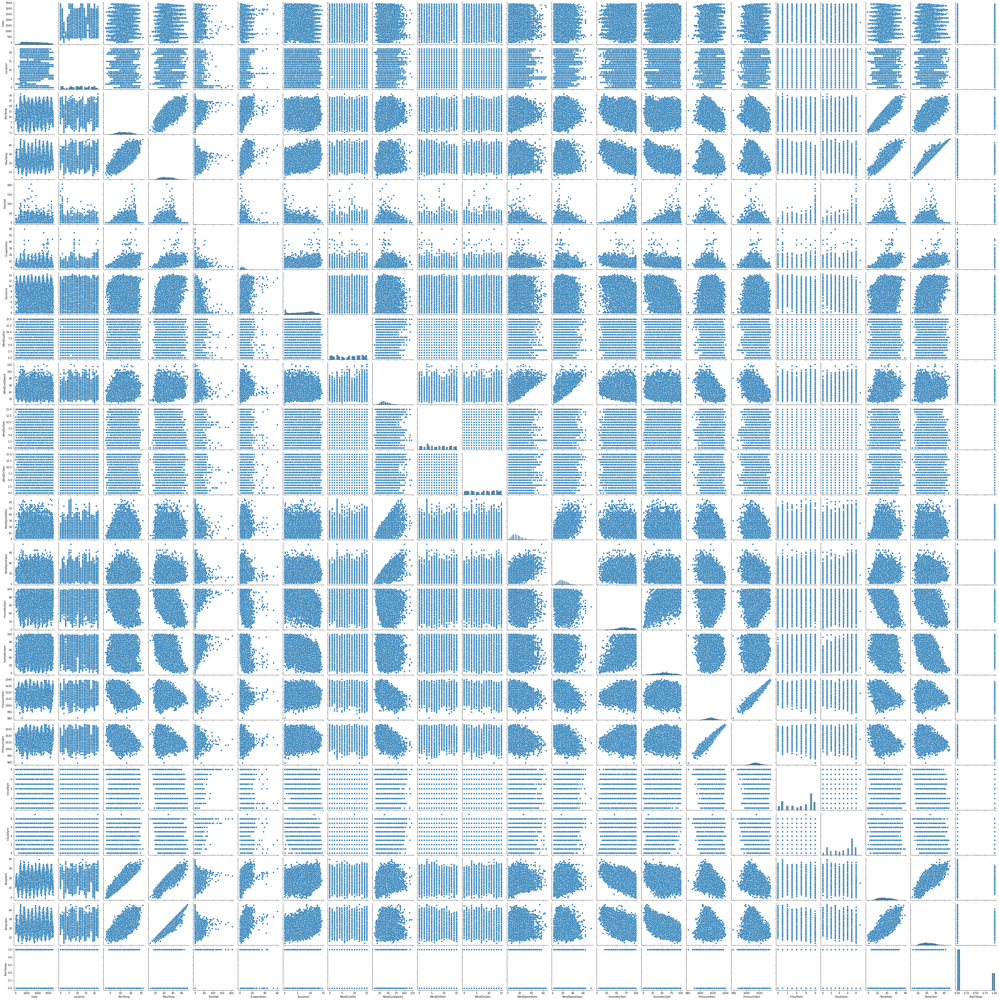

In [10]:
sns.pairplot(X_train)

In [27]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [13]:
lr = LogisticRegression(random_state=2021)
lr.fit(X_train_scaled,y_train)

LogisticRegression(random_state=2021)

In [14]:
print(confusion_matrix(y_test, lr.predict(X_test_scaled)))

[[2746  554]
 [ 685 2064]]


In [15]:
print(classification_report(y_test, lr.predict(X_test_scaled)))

              precision    recall  f1-score   support

           0       0.80      0.83      0.82      3300
           1       0.79      0.75      0.77      2749

    accuracy                           0.80      6049
   macro avg       0.79      0.79      0.79      6049
weighted avg       0.79      0.80      0.79      6049



In [16]:
print(lr.score(X_train_scaled,y_train))
print(lr.score(X_test_scaled,y_test))

0.798093348762881
0.7951727558274095


In [17]:
from sklearn.metrics import accuracy_score
print('Train accuracy = ',accuracy_score(y_train, lr.predict(X_train_scaled)))
print('Test accuracy = ',accuracy_score(y_test, lr.predict(X_test_scaled)))

Train accuracy =  0.798093348762881
Test accuracy =  0.7951727558274095


In [24]:
print('Train roc_auc_score = ',roc_auc_score(y_train, lr.predict(X_train_scaled)))
print('Test roc_auc_score = ',roc_auc_score(y_test, lr.predict(X_test_scaled)))

Train roc_auc_score =  0.7946530062944264
Test roc_auc_score =  0.7914698457841419


In [19]:
svc = SVC(C=50, gamma='scale',probability=True)
svc.fit(X_train_scaled,y_train)

SVC(C=50, probability=True)

In [18]:
print(confusion_matrix(y_test,svc.predict(X_test_scaled)))

[[2645  655]
 [ 662 2087]]


In [19]:
print(classification_report(y_test, svc.predict(X_test_scaled)))

              precision    recall  f1-score   support

           0       0.80      0.80      0.80      3300
           1       0.76      0.76      0.76      2749

    accuracy                           0.78      6049
   macro avg       0.78      0.78      0.78      6049
weighted avg       0.78      0.78      0.78      6049



In [20]:
print('Train accuracy = ',accuracy_score(y_train, svc.predict(X_train_scaled)))
print('Test accuracy = ',accuracy_score(y_test, svc.predict(X_test_scaled)))

Train accuracy =  0.9323855182674823
Test accuracy =  0.7822780624896677


In [21]:
print('Train Score = ',svc.score(X_train_scaled,y_train))
print('Test Score',svc.score(X_test_scaled,y_test))

Train Score =  0.9323855182674823
Test Score 0.7822780624896677


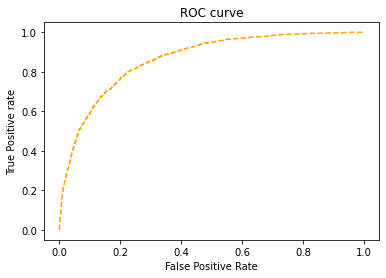

In [22]:
pred_prob = svc.predict_proba(X_test_scaled)

fpr, tpr, thresh = roc_curve(y_test, pred_prob[:,1], pos_label=1)

plt.plot(fpr, tpr,  linestyle='--',color='orange', label='SVM')

plt.title('ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')

plt.show()

In [25]:
print(roc_auc_score(y_test, svc.predict(X_test_scaled)))

0.7803501548772557


In [20]:
svc1 = SVC(C=1, gamma='scale',probability=True)
svc1.fit(X_train_scaled,y_train)

SVC(C=1, probability=True)

In [25]:
print(classification_report(y_test, svc1.predict(X_test_scaled)))

              precision    recall  f1-score   support

           0       0.82      0.83      0.83      3300
           1       0.80      0.78      0.79      2749

    accuracy                           0.81      6049
   macro avg       0.81      0.81      0.81      6049
weighted avg       0.81      0.81      0.81      6049



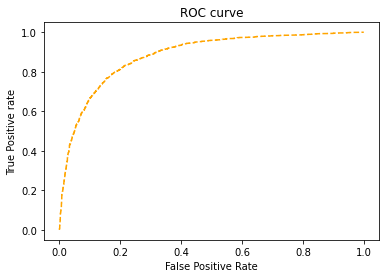

In [26]:
pred_prob1 = svc1.predict_proba(X_test_scaled)
fpr1, tpr1, thresh1 = roc_curve(y_test, pred_prob1[:,1], pos_label=1)
plt.plot(fpr1, tpr1,  linestyle='--',color='orange', label='SVM1')

plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.show()

In [22]:
print('Train Score = ',svc1.score(X_train_scaled,y_train))
print('Test Score',svc1.score(X_test_scaled,y_test))

Train Score =  0.8338017303135504
Test Score 0.8082327657464043


In [23]:
print('Train accuracy = ',accuracy_score(y_train, svc1.predict(X_train_scaled)))
print('Test accuracy = ',accuracy_score(y_test, svc1.predict(X_test_scaled)))

Train accuracy =  0.8338017303135504
Test accuracy =  0.8082327657464043


In [26]:
print(roc_auc_score(y_test, svc1.predict(X_test_scaled)))

0.8056868613380073


In [ ]:
X = scaler.fit_transform(x)
cvs = cross_val_score(svc1,X,y,cv=5)
cvs.mean()

In [21]:
print(confusion_matrix(y_test,svc1.predict(X_test_scaled)))

[[2751  549]
 [ 611 2138]]


In [13]:
from sklearn.ensemble import RandomForestClassifier

In [51]:
rfc = RandomForestClassifier(n_estimators=1000, min_samples_split=50)

In [52]:
rfc.fit(X_train_scaled, y_train)

RandomForestClassifier(min_samples_split=50, n_estimators=1000)

In [53]:
confusion_matrix(y_test,rfc.predict(X_test_scaled))

array([[2747,  553],
       [ 632, 2117]], dtype=int64)

In [54]:
print('Train accuracy = ',accuracy_score(y_train, rfc.predict(X_train_scaled)))
print('Test accuracy = ',accuracy_score(y_test, rfc.predict(X_test_scaled)))


Train accuracy =  0.867250785253761
Test accuracy =  0.8040998512150769
